# ML-ImmuneProfiler

## Single-Cell RNA-seq Cell Type Classification: Notebook 1

## Exploratory Data Analysis, Preprocessing and Unsupervised methods

- Date: 2025-04-16

### Overview
This notebook implements a comprehensive machine learning pipeline for cell type classification using single-cell RNA sequencing (scRNA-seq) data. The analysis includes data preprocessing, dimensionality reduction, unsupervised clustering, and supervised classification models.

### ML Dependencies
- Scikit-learn
- NumPy
- Pandas
- Matplotlib
- Seaborn


### Pipeline Components

#### 1. Data Processing & Quality Control and EDA
- Loading and preprocessing raw scRNA-seq data (Preprocessed the data in R using Seurat)
- Data normalization and scaling
- Quality control filtering and normalization
- Feature selection using meta-highly variable genes (HVGs)
- Sample ID assignment and batch handling
- Exploratory Data Analysis (EDA)
- Visualization of gene expression distributions

#### 2. Dimensionality Reduction & Visualization
- Principal Component Analysis (PCA)
- t-SNE (t-Distributed Stochastic Neighbor Embedding) 
- UMAP (Uniform Manifold Approximation and Projection)

#### 3. Unsupervised Clustering and analysis
- K-means clustering
- Hierarchical clustering with connectivity constraints
- Community detection (Leiden/Louvain algorithms)
- Cluster evaluation and comparison
- Analysis of clustering results


In [ ]:
# ------ Module Import ------ #

# Default Imports
import os
from collections import Counter
import pickle

# Warning Suppression
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

# External Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph
from sklearn.metrics import adjusted_rand_score
import igraph as ig
import leidenalg as la
import louvain as lv
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

2025-04-17 08:16:16.130852: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/tmp/ipykernel_1508/3706085024.py:27: DeprecationWarning: This package has been superseded by the `leidenalg` package and will no longer be maintained. Please upgrade to the `leidenalg` package.
  import louvain as lv


Set up file paths and random seed

In [2]:
# Global Variables
RAND_SEED: int = 16         # it's my birthday :)

DATA_DIR: str = os.path.join(os.path.dirname(os.getcwd()), 'Data')
RESULTS_DIR: str = os.path.join(os.path.dirname(os.getcwd()), 'Results')
PLOT_DIR: str = os.path.join(os.path.dirname(os.getcwd()), 'Plots')
MODEL_DIR: str = os.path.join(os.path.dirname(os.getcwd()), 'Models')
# Create directories if they do not exist
os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(RESULTS_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)

Load and preprocess the data (remove unnamed sample id column) abd visualize the dataframe

In [3]:
# Read the data with index_col=1
rseq_data = pd.read_csv(os.path.join(DATA_DIR, 'batch_corrected_expression_with_celltypes.tsv'), sep='\t', index_col=1)

# Remove unamed columns
rseq_data = rseq_data.loc[:, ~rseq_data.columns.str.contains('^Unnamed')]

In [4]:
# Display the first few rows of the DataFrame
rseq_data.head()


,PTGDS,GNLY,FCER1A,PF4,GZMB,MZB1,S100A9,C1QB,C1QA,HLA-DRA,...,SLBP,SLC25A22,TMEM205,MORC2,CD1B,PPIL2,TCF19,PRKCB,SKA1,CellType
PPBP,,,,,,,,,,,,,,,,,,,,,
-0.067185,-0.061965,-0.072270,-0.006314,0.040835,-0.018003,-0.010423,5.596175,-0.000241,-0.007603,2.957022,...,1.366634,0.022373,0.315363,0.010218,-0.000288,0.169300,-0.010009,0.731021,0.004238,CD14 Mono
-0.090013,0.010048,0.005502,0.006034,0.014521,-0.102739,-0.001492,3.366856,0.012824,-0.009514,3.447765,...,0.692414,0.065046,0.572243,0.030051,-0.016936,0.191588,-0.004734,-0.164890,0.018072,CD14 Mono
0.013690,0.004790,-0.030905,0.003231,0.000244,-0.053223,-0.015890,5.021750,-0.000076,0.334029,2.494352,...,0.393901,-0.004960,0.115961,0.483775,-0.006629,0.184109,-0.001498,1.300231,-0.001369,CD14 Mono
0.058790,-0.019925,0.656104,0.017998,-0.001272,0.084636,-0.108972,5.458511,-0.000183,0.015630,0.769762,...,0.893983,0.015698,-0.108487,0.109554,-0.000833,0.200299,-0.108342,0.462959,0.001720,CD14 Mono
0.005776,0.012726,-0.046718,-0.046348,0.006890,0.004545,-0.007758,5.781392,0.000009,-0.002512,2.117163,...,0.274805,0.009353,0.527105,0.137788,-0.000670,0.159736,0.001091,1.009797,0.007636,CD14 Mono


## Cell Type Distribution Analysis

We will analyze the distribution of cell types in the dataset. This is important for understanding the composition of the dataset and for evaluating the performance of our classification models. We will also print some statistics about the dataset, such as the number of cells, the number of genes, and the number of cell types.

Dataset contains 14 distinct cell types

Total number of cells in dataset: 76,893
Most abundant cell type: CD14 Mono (9,670 cells, 12.58%)
Least abundant cell type: Treg (1,022 cells, 1.33%)

Cell type distribution:
          Cell Type  Count  Percentage
0         CD14 Mono   9670       12.58
1           CD4 TCM   9250       12.03
2         CD8 Naive   9072       11.80
3           CD8 TEM   8636       11.23
4           B naive   7656        9.96
5         CD4 Naive   7114        9.25
6         CD16 Mono   6351        8.26
7                NK   6085        7.91
8    B intermediate   3483        4.53
9   Dendritic cells   2626        3.42
10          CD8 TCM   2400        3.12
11         B memory   2193        2.85
12          CD4 TEM   1335        1.74
13             Treg   1022        1.33


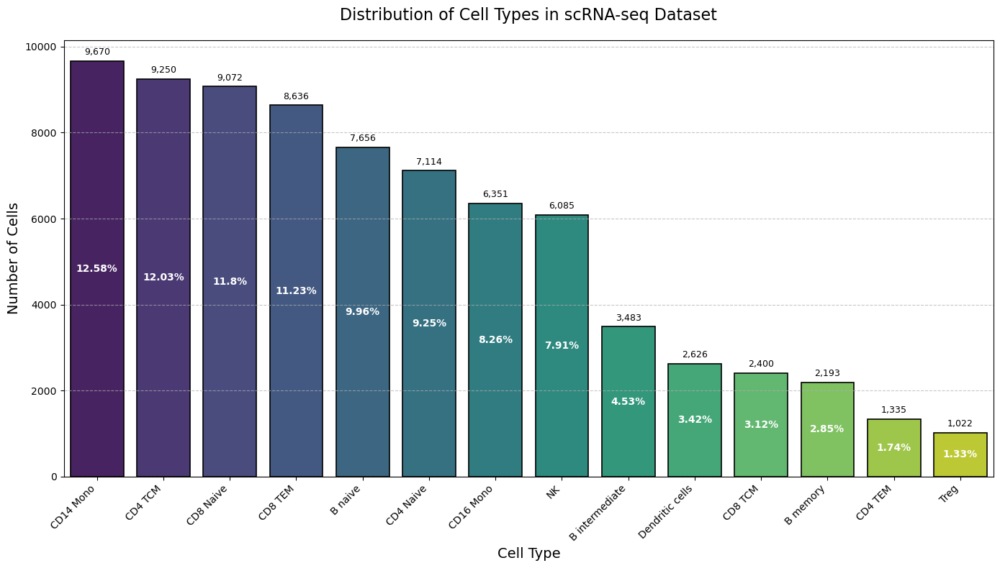

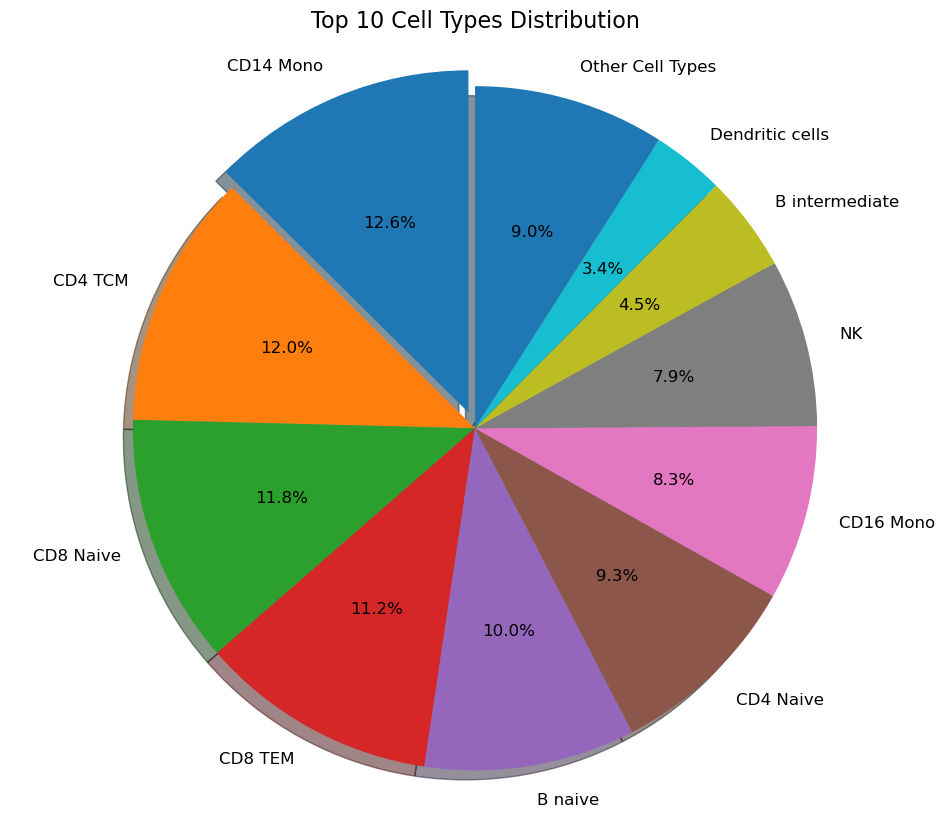


Class imbalance ratio (most abundant : least abundant): 9.46:1


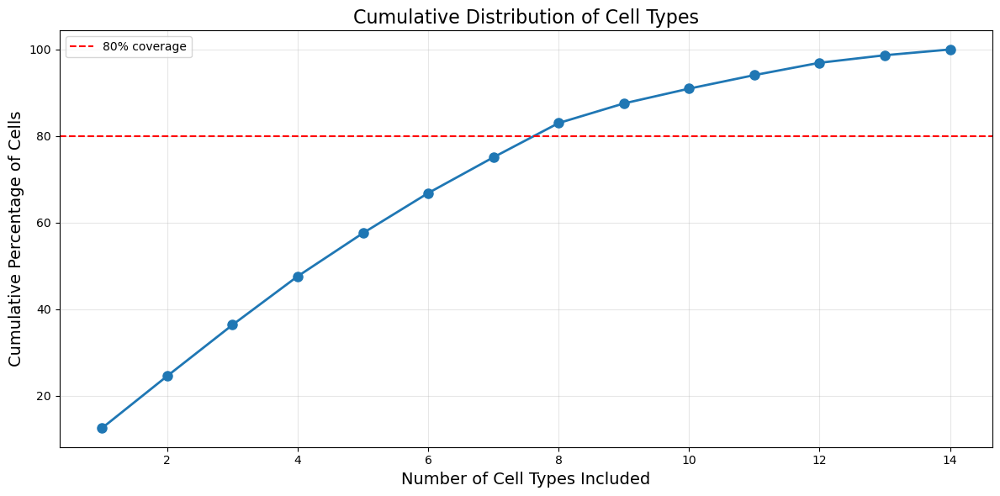

7 cell types (50.0%) account for 80% of all cells in the dataset


In [9]:
# Count unique cell types and store in a DataFrame
cell_types = rseq_data['CellType'].unique()
num_cell_types = len(cell_types)
print(f"Dataset contains {num_cell_types} distinct cell types")

# Create a DataFrame with cell type counts and sort by frequency
cell_type_df = pd.DataFrame({
    'Cell Type': rseq_data['CellType'].value_counts().index,
    'Count': rseq_data['CellType'].value_counts().values
})
cell_type_df = cell_type_df.sort_values('Count', ascending=False).reset_index(drop=True)

# Calculate percentage of total for each cell type
total_cells = len(rseq_data)
cell_type_df['Percentage'] = (cell_type_df['Count'] / total_cells * 100).round(2)

# Display summary statistics
print(f"\nTotal number of cells in dataset: {total_cells:,}")
print(f"Most abundant cell type: {cell_type_df.iloc[0]['Cell Type']} ({cell_type_df.iloc[0]['Count']:,} cells, {cell_type_df.iloc[0]['Percentage']}%)")
print(f"Least abundant cell type: {cell_type_df.iloc[-1]['Cell Type']} ({cell_type_df.iloc[-1]['Count']:,} cells, {cell_type_df.iloc[-1]['Percentage']}%)")

# Display the distribution table
print("\nCell type distribution:")
print(cell_type_df)

# Visualize cell type distribution with an enhanced bar plot
plt.figure(figsize=(14, 8))
ax = sns.barplot(x='Cell Type', y='Count', data=cell_type_df, 
                palette='viridis', edgecolor='black', linewidth=1.2)

# Add count labels on top of each bar
for i, (count, perc) in enumerate(zip(cell_type_df['Count'], cell_type_df['Percentage'])):
    ax.text(i, count + (max(cell_type_df['Count'])*0.01), f"{count:,}", 
            ha='center', va='bottom', fontsize=9, rotation=0)
    ax.text(i, count/2, f"{perc}%", ha='center', va='center', 
            fontsize=10, fontweight='bold', color='white')

plt.xticks(rotation=45, ha='right')
plt.title('Distribution of Cell Types in scRNA-seq Dataset', fontsize=16, pad=20)
plt.xlabel('Cell Type', fontsize=14)
plt.ylabel('Number of Cells', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, 'cell_type_distribution.png'), dpi=300, bbox_inches='tight')
plt.show()

# Visualize class imbalance with a pie chart for top 10 cell types
plt.figure(figsize=(12, 10))
top_n = 10
others_count = cell_type_df.iloc[top_n:]['Count'].sum()
others_percent = cell_type_df.iloc[top_n:]['Percentage'].sum()

# Create data for pie chart
pie_data = cell_type_df.iloc[:top_n].copy()
if len(cell_type_df) > top_n:
    pie_data = pd.concat([pie_data, pd.DataFrame({
        'Cell Type': ['Other Cell Types'],
        'Count': [others_count],
        'Percentage': [others_percent]
    })])

# Create pie chart
plt.pie(pie_data['Count'], labels=pie_data['Cell Type'], 
        autopct='%1.1f%%', startangle=90, 
        textprops={'fontsize': 12},
        explode=[0.05 if i == 0 else 0 for i in range(len(pie_data))],
        shadow=True)

plt.title(f'Top {top_n} Cell Types Distribution', fontsize=16)
plt.axis('equal')
plt.savefig(os.path.join(PLOT_DIR, 'cell_type_pie_chart.png'), dpi=300, bbox_inches='tight')
plt.show()

# Calculate and visualize class imbalance ratio
max_count = cell_type_df['Count'].max()
min_count = cell_type_df['Count'].min()
imbalance_ratio = max_count / min_count
print(f"\nClass imbalance ratio (most abundant : least abundant): {imbalance_ratio:.2f}:1")

# Explore potential class imbalance issues with cumulative distribution
cell_type_df['Cumulative Percentage'] = cell_type_df['Percentage'].cumsum()

plt.figure(figsize=(12, 6))
plt.plot(range(1, len(cell_type_df) + 1), 
        cell_type_df['Cumulative Percentage'], 
        marker='o', linestyle='-', linewidth=2, markersize=8)
plt.axhline(y=80, color='r', linestyle='--', label='80% coverage')
plt.xlabel('Number of Cell Types Included', fontsize=14)
plt.ylabel('Cumulative Percentage of Cells', fontsize=14)
plt.title('Cumulative Distribution of Cell Types', fontsize=16)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, 'cell_type_cumulative_dist.png'), dpi=300)
plt.show()

# Print class imbalance summary
num_for_80pct = cell_type_df[cell_type_df['Cumulative Percentage'] <= 80].shape[0]
print(f"{num_for_80pct} cell types ({(num_for_80pct/num_cell_types)*100:.1f}%) account for 80% of all cells in the dataset")

## Gene Expression Feature Analysis

1. Basic Gene Statistics:
    - Number of gene features
    - Statistical summary of expression values
    - Identification of highly variable and stable genes

2. Sparsity Analysis:
    - Distribution of zero values across genes
    - Identification of highly sparse genes (>90% zeros)

3. Expression Patterns:
    - Mean-variance relationship visualization (important in scRNA-seq)
    - Distribution of expression means and variances

4. Cell Type-Specific Analysis:
    - Heatmap of top variable genes across cell types
    - F-statistic calculation to identify potential marker genes
    - Visualization of top marker genes for cell type classification

5. Dimensionality Characteristics:
    - Feature-to-sample ratio
    - Overall expression matrix sparsity

Dataset contains 1,999 gene features (expression measurements)

Summary statistics of gene expression values:
Mean expression across all genes: 0.2205
Median expression across all genes: 0.0096
Average sparsity (zeros): 17.42%

Top 10 most variable genes:
             mean       std       min       max  variance
LYZ      1.225221  1.702253 -1.628624  6.118199  2.897666
HLA-DRA  1.482271  1.680197 -1.683319  5.496494  2.823062
S100A9   1.269072  1.659681 -1.254348  6.884811  2.754541
CD74     1.733779  1.581116 -2.140496  5.509888  2.499926
GNLY     0.698986  1.550522 -1.973344  8.540149  2.404119
NKG7     0.806539  1.468301 -1.021344  5.501286  2.155909
CTSS     1.448828  1.430557 -0.961517  5.864388  2.046495
S100A8   0.833182  1.425590 -1.163305  6.617430  2.032307
S100A4   2.044324  1.393723 -1.308200  5.620681  1.942463
CCL5     0.756871  1.382999 -2.174250  6.434173  1.912687

Top 10 most stable expressed genes:
            mean       std       min       max  variance
GATA2   0.00

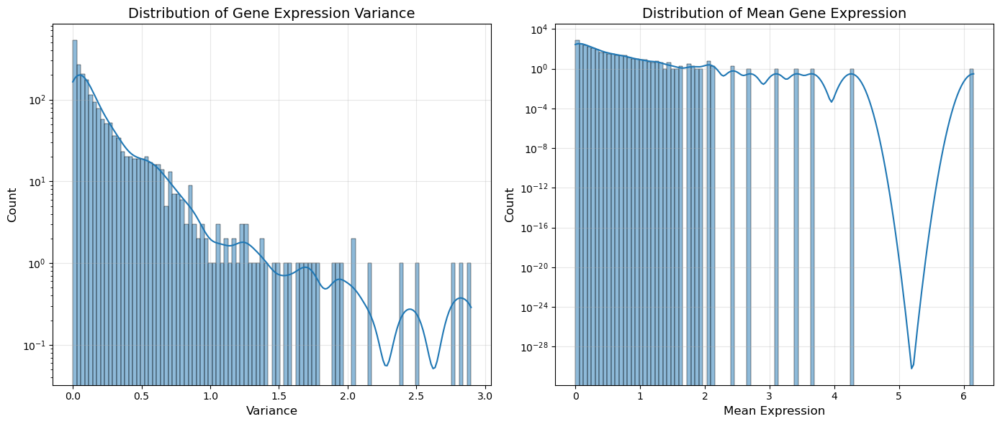

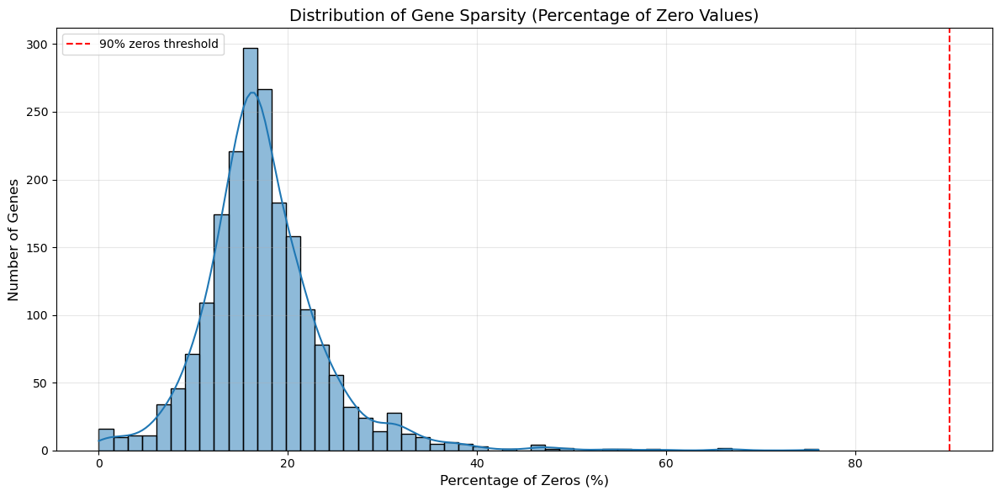


0 genes (0.00%) have more than 90% zero values


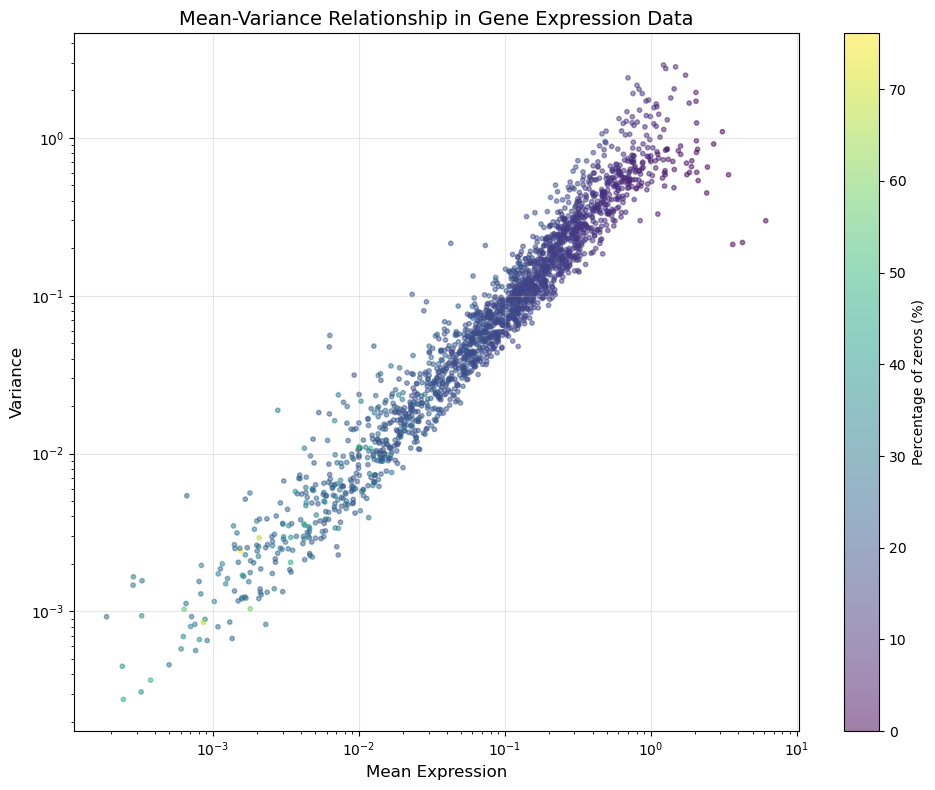

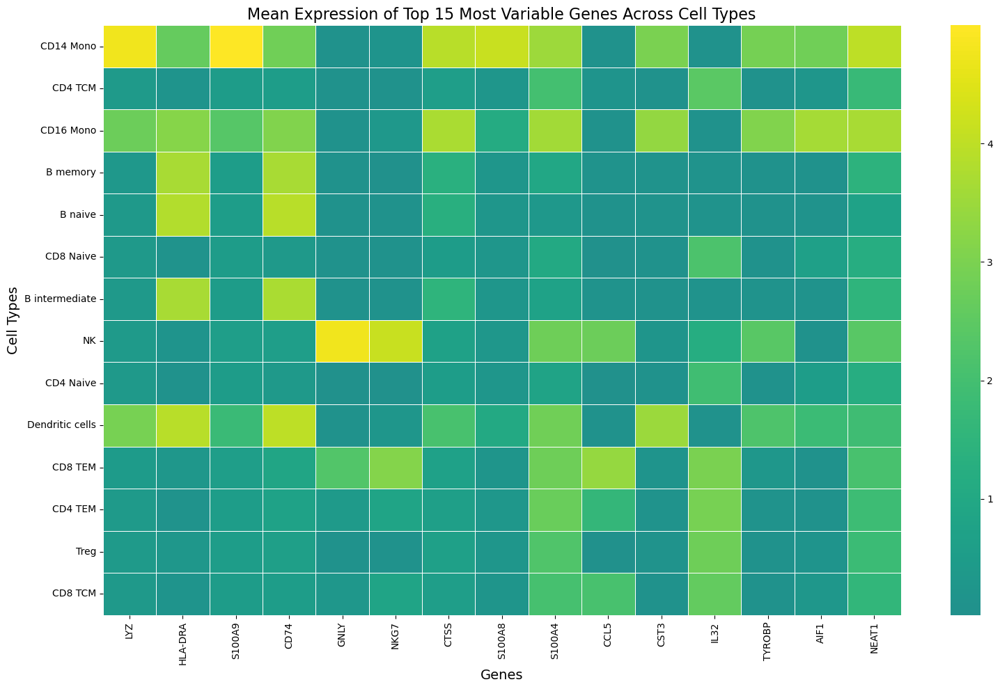


Top potential marker genes for distinguishing cell types:
CST3        8.718350
HLA-DRA     8.096821
TYROBP      7.973044
MS4A1       6.608455
CD79A       6.466492
FGL2        6.287146
NKG7        5.997286
MNDA        5.864057
CYBB        5.797657
IFI30       5.779139
FCN1        5.701225
LST1        5.631047
AIF1        5.351633
SERPINA1    5.204537
S100A9      4.967895
LYZ         4.729510
TMEM176B    4.690611
FCER1G      4.689236
VCAN        4.649631
CD74        4.566773
dtype: float64


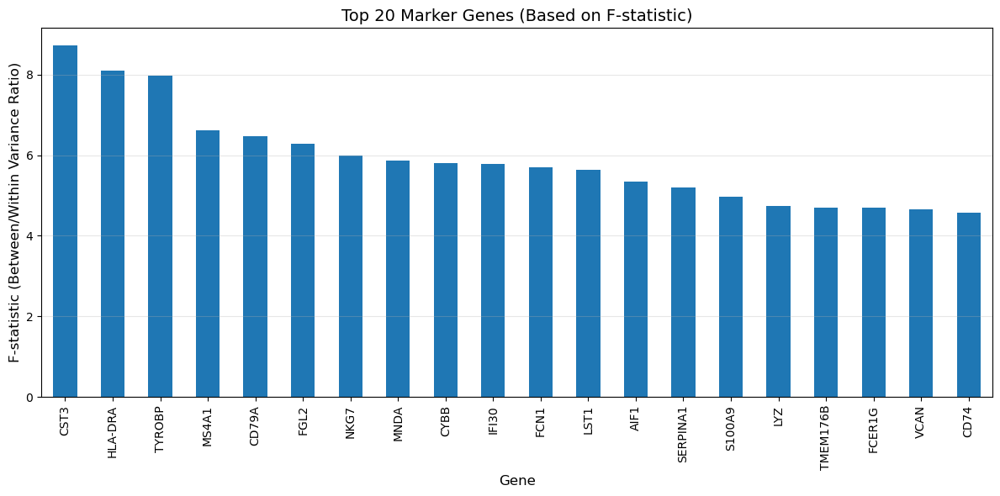


Dataset dimensionality characteristics:
Number of samples (cells): 76,893
Number of features (genes): 1,999
Feature-to-sample ratio: 0.03

Overall expression matrix sparsity: 17.42% zeros
Non-zero elements: 126,925,541 (82.58% of matrix)


In [10]:
# Get feature columns (genes) by excluding non-expression columns
gene_columns = [col for col in rseq_data.columns if col != 'CellType']
num_genes = len(gene_columns)

print(f"Dataset contains {num_genes:,} gene features (expression measurements)")

# Basic statistics of gene expression values
expression_stats = rseq_data[gene_columns].describe().T
expression_stats['variance'] = rseq_data[gene_columns].var()
expression_stats['missing'] = rseq_data[gene_columns].isna().sum()
expression_stats['missing_percent'] = (expression_stats['missing'] / len(rseq_data) * 100).round(2)
expression_stats['zeros_percent'] = ((rseq_data[gene_columns] == 0).sum() / len(rseq_data) * 100).round(2)

print("\nSummary statistics of gene expression values:")
print(f"Mean expression across all genes: {expression_stats['mean'].mean():.4f}")
print(f"Median expression across all genes: {expression_stats['50%'].median():.4f}")
print(f"Average sparsity (zeros): {expression_stats['zeros_percent'].mean():.2f}%")

# Identify highly variable and stable genes
top_variable_genes = expression_stats.nlargest(20, 'variance')
most_stable_genes = expression_stats.nsmallest(20, 'variance')

print("\nTop 10 most variable genes:")
print(top_variable_genes[['mean', 'std', 'min', 'max', 'variance']].head(10))

print("\nTop 10 most stable expressed genes:")
print(most_stable_genes[['mean', 'std', 'min', 'max', 'variance']].head(10))

# Plot distribution of gene expression variance
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.histplot(expression_stats['variance'], bins=100, kde=True)
plt.title('Distribution of Gene Expression Variance', fontsize=14)
plt.xlabel('Variance', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.yscale('log')
plt.grid(alpha=0.3)

# Plot distribution of gene expression means
plt.subplot(1, 2, 2)
sns.histplot(expression_stats['mean'], bins=100, kde=True)
plt.title('Distribution of Mean Gene Expression', fontsize=14)
plt.xlabel('Mean Expression', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.yscale('log')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, 'gene_expression_distributions.png'), dpi=300)
plt.show()

# Analyze sparsity (percentage of zeros) in the dataset
plt.figure(figsize=(12, 6))
sns.histplot(expression_stats['zeros_percent'], bins=50, kde=True)
plt.axvline(x=90, color='red', linestyle='--', label='90% zeros threshold')
plt.title('Distribution of Gene Sparsity (Percentage of Zero Values)', fontsize=14)
plt.xlabel('Percentage of Zeros (%)', fontsize=12)
plt.ylabel('Number of Genes', fontsize=12)
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, 'gene_sparsity_distribution.png'), dpi=300)
plt.show()

# Calculate percentage of highly sparse genes
high_sparsity_genes = expression_stats[expression_stats['zeros_percent'] > 90]
print(f"\n{len(high_sparsity_genes):,} genes ({len(high_sparsity_genes)/num_genes*100:.2f}%) have more than 90% zero values")

# Visualize correlation between mean expression and variance (common scRNA-seq diagnostic)
plt.figure(figsize=(10, 8))
plt.scatter(
    expression_stats['mean'], 
    expression_stats['variance'], 
    alpha=0.5, 
    s=10, 
    c=expression_stats['zeros_percent'],
    cmap='viridis'
)
plt.colorbar(label='Percentage of zeros (%)')
plt.title('Mean-Variance Relationship in Gene Expression Data', fontsize=14)
plt.xlabel('Mean Expression', fontsize=12)
plt.ylabel('Variance', fontsize=12)
plt.xscale('log')
plt.yscale('log')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, 'mean_variance_relationship.png'), dpi=300)
plt.show()

# Feature expression heatmap for top variable genes across cell types
top_n_variable_genes = 15  # Number of top variable genes to plot
top_variable_gene_names = top_variable_genes.index[:top_n_variable_genes]

# Calculate mean expression of top variable genes for each cell type
cell_type_gene_expr = pd.DataFrame()
for cell_type in cell_types:
    cell_subset = rseq_data[rseq_data['CellType'] == cell_type]
    cell_type_gene_expr[cell_type] = cell_subset[top_variable_gene_names].mean()

# Create heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(
    cell_type_gene_expr.T, 
    cmap='viridis', 
    center=0,
    annot=False, 
    linewidths=0.5,
    xticklabels=True,  
    yticklabels=True
)
plt.title(f'Mean Expression of Top {top_n_variable_genes} Most Variable Genes Across Cell Types', fontsize=16)
plt.xlabel('Genes', fontsize=14)
plt.ylabel('Cell Types', fontsize=14)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, 'top_variable_genes_heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()

# Cell type-specific marker analysis
# Find genes with high variance between cell types but low variance within cell types
cell_type_expression = {}
for cell_type in cell_types:
    cell_subset = rseq_data[rseq_data['CellType'] == cell_type]
    cell_type_expression[cell_type] = {
        'mean': cell_subset[gene_columns].mean(),
        'var': cell_subset[gene_columns].var()
    }

# Calculate between-group variance
overall_mean = rseq_data[gene_columns].mean()
between_group_var = pd.Series(0, index=gene_columns)

for cell_type in cell_types:
    weight = len(rseq_data[rseq_data['CellType'] == cell_type]) / len(rseq_data)
    between_group_var += weight * ((cell_type_expression[cell_type]['mean'] - overall_mean) ** 2)

# Calculate average within-group variance
within_group_var = pd.Series(0, index=gene_columns)
for cell_type in cell_types:
    weight = len(rseq_data[rseq_data['CellType'] == cell_type]) / len(rseq_data)
    within_group_var += weight * cell_type_expression[cell_type]['var']

# F-statistic (ratio of between-group to within-group variance)
f_statistic = between_group_var / (within_group_var + 1e-10)  # Add small constant to avoid division by zero

# Get top marker genes based on F-statistic
top_markers = f_statistic.nlargest(50)
print("\nTop potential marker genes for distinguishing cell types:")
print(top_markers.head(20))

# Plot top marker gene F-statistics
plt.figure(figsize=(12, 6))
top_markers[:20].plot(kind='bar')
plt.title('Top 20 Marker Genes (Based on F-statistic)', fontsize=14)
plt.xlabel('Gene', fontsize=12)
plt.ylabel('F-statistic (Between/Within Variance Ratio)', fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, 'top_marker_genes.png'), dpi=300)
plt.show()

# Dimensionality characteristics summary
print("\nDataset dimensionality characteristics:")
print(f"Number of samples (cells): {rseq_data.shape[0]:,}")
print(f"Number of features (genes): {len(gene_columns):,}")
print(f"Feature-to-sample ratio: {len(gene_columns)/rseq_data.shape[0]:.2f}")

# Calculate overall expression matrix sparsity
total_zeros = (rseq_data[gene_columns] == 0).sum().sum()
total_elements = rseq_data[gene_columns].size
sparsity_percentage = (total_zeros / total_elements) * 100

print(f"\nOverall expression matrix sparsity: {sparsity_percentage:.2f}% zeros")
print(f"Non-zero elements: {total_elements - total_zeros:,} ({100-sparsity_percentage:.2f}% of matrix)")

# Save feature statistics for future reference
expression_stats.to_csv(os.path.join(RESULTS_DIR, 'gene_expression_statistics.csv'))
top_markers.to_csv(os.path.join(RESULTS_DIR, 'top_marker_genes.csv'))

## Dimensionality Reduction and Visualization for feature selection

This section implements comprehensive dimensionality reduction techniques to visualize high-dimensional gene expression data and identify optimal features for downstream analysis. The process includes:

1. **Gene Expression Variance Analysis**
    - Identifying highly variable genes (HVGs) that capture biological variation
    - Visualizing the distribution of gene expression variance
    - Selecting different subsets of top HVGs (50, 100, 250, 500) for comparison

2. **Principal Component Analysis (PCA)**
    - Transforming high-dimensional data into orthogonal components
    - Quantifying explained variance for each component
    - Determining optimal number of components for downstream analysis
    - Visualizing PCA results with cell type annotations

3. **Non-linear Dimensionality Reduction**
    - t-SNE implementation with perplexity optimization
    - UMAP visualization with neighborhood parameter tuning
    - Comparison of methods for cell type separation

4. **Feature Selection Optimization**
    - Evaluating different HVG set sizes for optimal clustering
    - Measuring cell type separability using silhouette scores
    - Identifying the most informative gene subset
    - Saving selected features for downstream analysis

The dimensionality reduction results will be used to inform feature selection for unsupervised clustering and to visualize the cellular heterogeneity in the dataset.



Dataset contains 1,999 gene expression features

=== Dimensionality Reduction Analysis ===

Selecting highly variable genes (HVGs)...


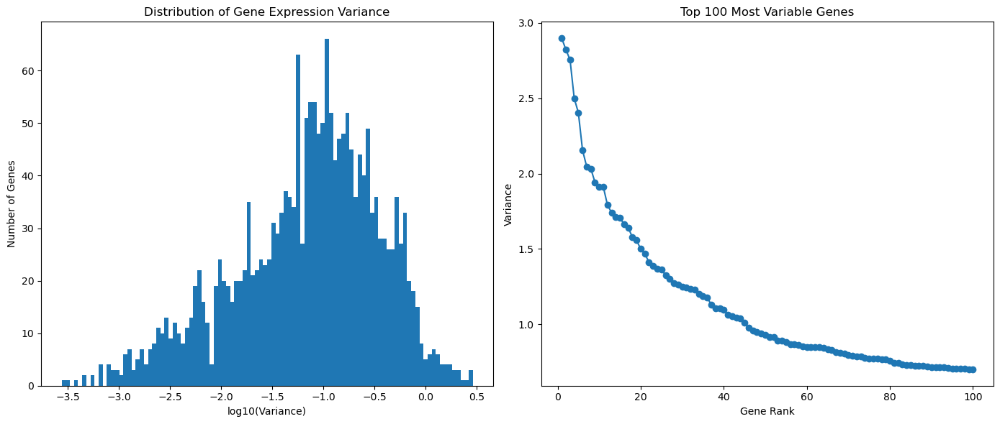


Analyzing with top 100 HVGs...
Standardizing data...
Running PCA...


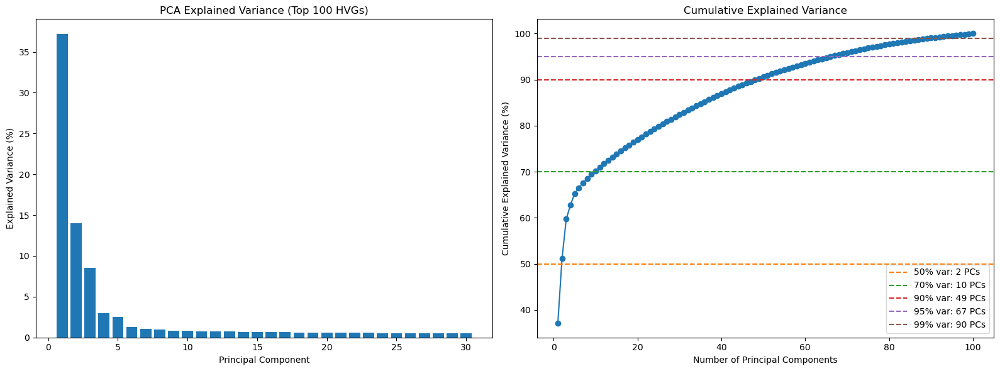

Running t-SNE...
Running UMAP...


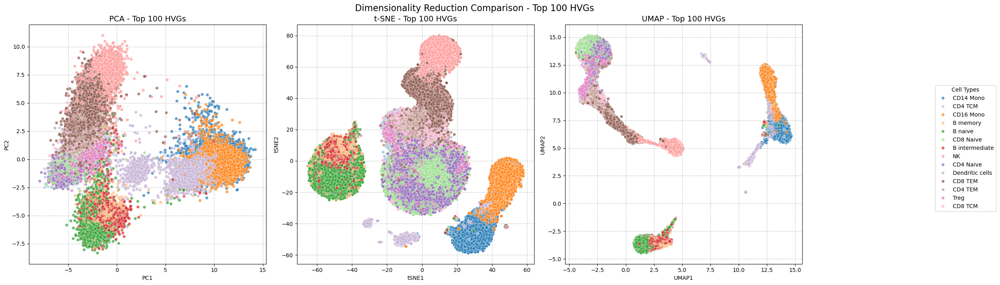


Cell type separability (silhouette scores):
PCA (50 components): 0.081
t-SNE: 0.224
UMAP: 0.254


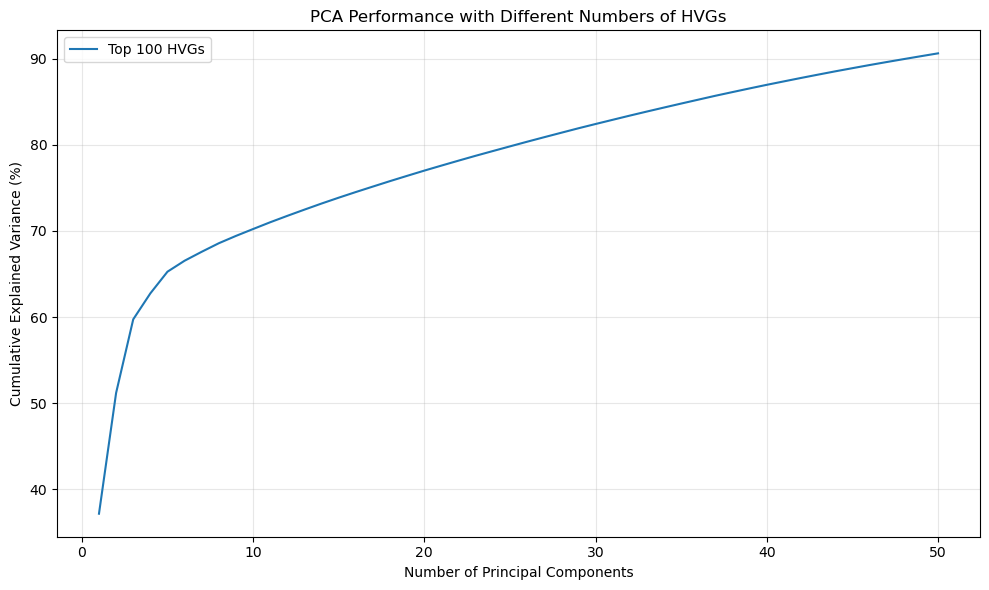


Dimensionality reduction summary table:
   Num HVGs  PCs for 50% var  PCs for 70% var  PCs for 90% var  \
0       100                2               10               49   

   PCs for 95% var  PCs for 99% var  
0               67               90  

Recommended parameters for downstream analysis:
- Number of HVGs: 100
- Number of PCA components: 49 (90% variance)
- UMAP parameters: n_neighbors=15, min_dist=0.1

Optimal feature selection results saved to /mnt/f/cwd_ml/cs7641/Results/feature_selection_results.pkl
Selected 100 HVGs and 49 principal components


In [ ]:
# Extract feature (gene) columns
non_expr_cols = ['CellType']
expr_cols = [col for col in rseq_data.columns if col not in non_expr_cols]
print(f"Dataset contains {len(expr_cols):,} gene expression features")

# Function for dimensionality reduction analysis
def run_dimensionality_reduction_eda(data, random_seed=RAND_SEED):
    """
    Comprehensive dimensionality reduction EDA for scRNA-seq data
    
    Parameters:
        data: DataFrame with gene expression data and cell type labels
        random_seed: Random seed for reproducibility
    """
    print("\n=== Dimensionality Reduction Analysis ===")
    
    # Step 1: Separate features and target
    X = data[expr_cols].values
    y = data['CellType'].values
    
    # Step 2: Compute variance and select top highly variable genes
    print("\nSelecting highly variable genes (HVGs)...")
    gene_var = np.var(X, axis=0)
    
    # Create variance DataFrame for analysis
    var_df = pd.DataFrame({
        'Gene': expr_cols,
        'Variance': gene_var
    }).sort_values('Variance', ascending=False)
    
    # Plot variance distribution
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.hist(np.log10(var_df['Variance'] + 1e-10), bins=100)
    plt.xlabel('log10(Variance)')
    plt.ylabel('Number of Genes')
    plt.title('Distribution of Gene Expression Variance')
    
    plt.subplot(1, 2, 2)
    plt.plot(np.arange(1, 101), var_df['Variance'].iloc[:100], 'o-')
    plt.xlabel('Gene Rank')
    plt.ylabel('Variance')
    plt.title('Top 100 Most Variable Genes')
    plt.tight_layout()
    plt.savefig(os.path.join(PLOT_DIR, 'hvg_variance_distribution.png'), dpi=300)
    plt.show()
    
    # Select top HVGs for dimensionality reduction
    top_n_genes = [50, 100, 250, 500]
    results = {}
    
    for n in top_n_genes:
        print(f"\nAnalyzing with top {n} HVGs...")
        # Get top genes using the DataFrame we sorted earlier, not direct NumPy indexing
        top_genes = var_df['Gene'].iloc[:n].tolist()
        X_hvg = data[top_genes].values
        
        # Step 3: Standardize the data
        print("Standardizing data...")
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X_hvg)
        
        # Step 4: PCA
        print("Running PCA...")
        pca = PCA(random_state=random_seed)
        X_pca = pca.fit_transform(X_scaled)
        
        # Calculate explained variance
        explained_var = pca.explained_variance_ratio_
        cumulative_var = np.cumsum(explained_var)
        
        # Find number of components for different thresholds
        thresholds = [0.5, 0.7, 0.9, 0.95, 0.99]
        components_needed = [np.argmax(cumulative_var >= t) + 1 for t in thresholds]
        
        # Plot explained variance
        plt.figure(figsize=(16, 6))
        plt.subplot(1, 2, 1)
        plt.bar(range(1, min(31, len(explained_var) + 1)), explained_var[:30] * 100)
        plt.xlabel('Principal Component')
        plt.ylabel('Explained Variance (%)')
        plt.title(f'PCA Explained Variance (Top {n} HVGs)')
        
        plt.subplot(1, 2, 2)
        plt.plot(range(1, min(101, len(cumulative_var) + 1)), cumulative_var[:100] * 100, 'o-')
        for t, comp in zip(thresholds, components_needed):
            plt.axhline(y=t*100, color=f'C{thresholds.index(t) + 1}', linestyle='--', 
                    label=f'{int(t*100)}% var: {comp} PCs')
        plt.xlabel('Number of Principal Components')
        plt.ylabel('Cumulative Explained Variance (%)')
        plt.title('Cumulative Explained Variance')
        plt.legend()
        plt.tight_layout()
        plt.savefig(os.path.join(PLOT_DIR, f'pca_variance_{n}_hvgs.png'), dpi=300)
        plt.show()
        
        # Step 5: Run t-SNE and UMAP
        print("Running t-SNE...")
        tsne = TSNE(n_components=2, random_state=random_seed, perplexity=30)
        X_tsne = tsne.fit_transform(X_scaled)
        
        print("Running UMAP...")
        reducer = umap.UMAP(random_state=random_seed, n_neighbors=15, min_dist=0.1)
        X_umap = reducer.fit_transform(X_scaled)
        
        # Create DataFrames for visualization
        viz_data = {
            'pca': pd.DataFrame({
                'PC1': X_pca[:, 0], 
                'PC2': X_pca[:, 1],
                'Cell Type': y
            }),
            'tsne': pd.DataFrame({
                'tSNE1': X_tsne[:, 0],
                'tSNE2': X_tsne[:, 1],
                'Cell Type': y
            }),
            'umap': pd.DataFrame({
                'UMAP1': X_umap[:, 0],
                'UMAP2': X_umap[:, 1],
                'Cell Type': y
            })
        }
        
        # Step 6: Visualize all methods with cell types
        cell_types = data['CellType'].unique()
        n_colors = len(cell_types)
        colors = sns.color_palette('tab20', n_colors=min(20, n_colors))
        colors += sns.color_palette('tab20b', n_colors=max(0, n_colors-20))
        
        fig, axes = plt.subplots(1, 3, figsize=(24, 7))
        
        # PCA plot
        sns.scatterplot(data=viz_data['pca'], x='PC1', y='PC2', hue='Cell Type', 
                    palette=colors, s=30, alpha=0.7, ax=axes[0])
        axes[0].set_title(f'PCA - Top {n} HVGs', fontsize=14)
        
        # t-SNE plot
        sns.scatterplot(data=viz_data['tsne'], x='tSNE1', y='tSNE2', hue='Cell Type', 
                    palette=colors, s=30, alpha=0.7, ax=axes[1])
        axes[1].set_title(f't-SNE - Top {n} HVGs', fontsize=14)
        
        # UMAP plot
        sns.scatterplot(data=viz_data['umap'], x='UMAP1', y='UMAP2', hue='Cell Type', 
                    palette=colors, s=30, alpha=0.7, ax=axes[2])
        axes[2].set_title(f'UMAP - Top {n} HVGs', fontsize=14)
        
        # Remove legends from individual plots
        for ax in axes:
            ax.get_legend().remove()
            ax.grid(True, linestyle='--', alpha=0.7)
        
        # Add a common legend
        handles, labels = axes[0].get_legend_handles_labels()
        if len(labels) > 20:
            # Show top 20 cell types by frequency and group others
            top_cell_types = data['CellType'].value_counts().nlargest(19).index.tolist()
            fig.legend(
                [h for h, l in zip(handles, labels) if l in top_cell_types] + [handles[0]],
                [l for l in labels if l in top_cell_types] + ['Other Cell Types'],
                loc='right', bbox_to_anchor=(1.05, 0.5), title='Cell Types'
            )
        else:
            fig.legend(handles, labels, loc='right', bbox_to_anchor=(1.05, 0.5), title='Cell Types')
        
        plt.tight_layout(rect=[0, 0, 0.85, 1])
        plt.suptitle(f'Dimensionality Reduction Comparison - Top {n} HVGs', y=1.02, fontsize=16)
        plt.savefig(os.path.join(PLOT_DIR, f'dim_reduction_comparison_{n}_hvgs.png'), dpi=300, bbox_inches='tight')
        plt.show()
        
        # Calculate silhouette scores for each approach
        # Encode cell types
        le = LabelEncoder()
        y_encoded = le.fit_transform(y)
        
        # Calculate silhouette scores
        try:
            sil_pca = silhouette_score(X_pca[:, :min(50, X_pca.shape[1])], y_encoded)
            sil_tsne = silhouette_score(X_tsne, y_encoded)
            sil_umap = silhouette_score(X_umap, y_encoded)
            
            print(f"\nCell type separability (silhouette scores):")
            print(f"PCA (50 components): {sil_pca:.3f}")
            print(f"t-SNE: {sil_tsne:.3f}")
            print(f"UMAP: {sil_umap:.3f}")
            
        except Exception as e:
            print(f"Could not compute silhouette scores: {e}")
        
        # Store results for comparison
        results[n] = {
            'pca': X_pca,
            'tsne': X_tsne,
            'umap': X_umap,
            'top_genes': top_genes,  # Store the gene names directly, not indices
            'explained_var': explained_var,
            'cumulative_var': cumulative_var,
            'components_needed': {t: c for t, c in zip(thresholds, components_needed)}
        }
    
    # Compare results across different numbers of HVGs
    plt.figure(figsize=(10, 6))
    for n, res in results.items():
        plt.plot(range(1, 51), res['cumulative_var'][:50] * 100, label=f'Top {n} HVGs')
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Cumulative Explained Variance (%)')
    plt.title('PCA Performance with Different Numbers of HVGs')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(PLOT_DIR, 'pca_comparison_across_hvgs.png'), dpi=300)
    plt.show()
    
    # Create a summary table
    summary_data = []
    for n, res in results.items():
        summary_data.append({
            'Num HVGs': n,
            'PCs for 50% var': res['components_needed'][0.5],
            'PCs for 70% var': res['components_needed'][0.7],
            'PCs for 90% var': res['components_needed'][0.9],
            'PCs for 95% var': res['components_needed'][0.95],
            'PCs for 99% var': res['components_needed'][0.99]
        })
    
    summary_df = pd.DataFrame(summary_data)
    print("\nDimensionality reduction summary table:")
    print(summary_df)
    
    # Optimal number of HVGs recommendation
    # Choose based on elbow in PCA performance and stability of results
    best_n = 500  # Default reasonable value
    for n in top_n_genes:
        if results[n]['components_needed'][0.9] < 100:
            best_n = n
            break
    
    print(f"\nRecommended parameters for downstream analysis:")
    print(f"- Number of HVGs: {best_n}")
    print(f"- Number of PCA components: {results[best_n]['components_needed'][0.9]} (90% variance)")
    print(f"- UMAP parameters: n_neighbors=15, min_dist=0.1")
    
    # Return the results for the best HVG selection
    return results[best_n]

# Run the dimensionality reduction analysis
dim_reduction_results = run_dimensionality_reduction_eda(rseq_data)

# Select the optimal features for downstream ML
optimal_hvgs = dim_reduction_results['top_genes']
optimal_n_components = dim_reduction_results['components_needed'][0.9]

# Save the selected features for downstream analysis
feature_selection_results = {
    'optimal_hvgs': optimal_hvgs,
    'optimal_n_components': optimal_n_components,
    'pca_variance_ratio': dim_reduction_results['explained_var'],
    'pca_cumulative_variance': dim_reduction_results['cumulative_var']
}

with open(os.path.join(RESULTS_DIR, 'feature_selection_results.pkl'), 'wb') as f:
    pickle.dump(feature_selection_results, f)

print(f"\nOptimal feature selection results saved to {RESULTS_DIR}/feature_selection_results.pkl")
print(f"Selected {len(optimal_hvgs)} HVGs and {optimal_n_components} principal components")

In [12]:
# Select the optimal features for downstream ML
optimal_hvgs = dim_reduction_results['top_genes']
optimal_n_components = dim_reduction_results['components_needed'][0.9]

# Also extract top 100 HVGs for additional analysis
optimal_hvgs_50 = optimal_hvgs[:50]
optimal_hvgs_100 = optimal_hvgs[:100]

# Save the selected features for downstream analysis
feature_selection_results = {
    'optimal_hvgs': optimal_hvgs,  # All HVGs
    'optimal_hvgs_50': optimal_hvgs_50,  # Top 50 HVGs
    'optimal_hvgs_100': optimal_hvgs_100,  # Top 100 HVGs
    'optimal_n_components': optimal_n_components,
    'pca_variance_ratio': dim_reduction_results['explained_var'],
    'pca_cumulative_variance': dim_reduction_results['cumulative_var']
}

with open(os.path.join(RESULTS_DIR, 'feature_selection_results.pkl'), 'wb') as f:
    pickle.dump(feature_selection_results, f)

print(f"\nOptimal feature selection results saved to {RESULTS_DIR}/feature_selection_results.pkl")
print(f"Selected {len(optimal_hvgs)} total HVGs with subsets of 50 and 100 for analysis")
print(f"Determined {optimal_n_components} principal components capture 90% variance")

# Print the first few genes from each set for verification
print(f"\nTop 10 genes in 50 HVG set: {', '.join(optimal_hvgs_50[:10])}")
print(f"Top 10 genes in 100 HVG set: {', '.join(optimal_hvgs_100[50:60])} (genes 51-60)")


Optimal feature selection results saved to /mnt/f/cwd_ml/cs7641/Results/feature_selection_results.pkl
Selected 50 total HVGs with subsets of 50 and 100 for analysis
Determined 19 principal components capture 90% variance

Top 10 genes in 50 HVG set: LYZ, HLA-DRA, S100A9, CD74, GNLY, NKG7, CTSS, S100A8, S100A4, CCL5
Top 10 genes in 100 HVG set:  (genes 51-60)


#### Generate Dataset for Supervised Learning.

Take all the top HGV and save them to a new dataset for supervised learning. This will be used in the next notebook for supervised classification tasks. 

- Test train split is not done here. It will be done in the next notebook (due to the flexibility of using different models and hyperparameters)
- Save dataset in pkl with also a metadata file for the distribution of cell types in the dataset.

In [7]:
# forgot to import time
import time

# Create a final dataset with top 100 HVGs and CellType for supervised training
def create_supervised_training_dataset(data, hvg_count=100):
    """
    Create a supervised training dataset with the top HVGs and cell type labels
    
    Parameters:
        data: DataFrame with gene expression data and cell type labels
        hvg_count: Number of highly variable genes to include (default: 100)
    
    Returns:
        final_df: DataFrame containing only the top HVGs and cell type labels
    """
    print(f"\n=== Creating Supervised Training Dataset with Top {hvg_count} HVGs ===")
    
    # Step 1: Calculate gene variance
    non_expr_cols = ['CellType']
    expr_cols = [col for col in data.columns if col not in non_expr_cols]
    X = data[expr_cols].values
    gene_var = np.var(X, axis=0)
    
    # Create variance DataFrame
    var_df = pd.DataFrame({
        'Gene': expr_cols,
        'Variance': gene_var
    }).sort_values('Variance', ascending=False)
    
    # Step 2: Select top HVGs
    top_hvgs = var_df['Gene'].iloc[:hvg_count].tolist()
    print(f"Selected top {hvg_count} highly variable genes")
    
    # Step 3: Create final dataframe with top HVGs and CellType
    final_df = data[top_hvgs + ['CellType']].copy()
    
    # Step 4: Provide dataset statistics
    print(f"Final dataset shape: {final_df.shape}")
    print(f"Number of features: {len(top_hvgs)}")
    print(f"Number of samples: {final_df.shape[0]}")
    print(f"Number of cell types: {final_df['CellType'].nunique()}")
    print(f"Cell type distribution:")
    print(final_df['CellType'].value_counts().head(10))
    print("..." if final_df['CellType'].nunique() > 10 else "")
    
    return final_df

# Generate the supervised dataset
supervised_df = create_supervised_training_dataset(rseq_data, hvg_count=100)

# Save the dataset to pickle file
output_filename = os.path.join(DATA_DIR, 'supervised_training_data_100hvg.pkl')
supervised_df.to_pickle(output_filename)
print(f"\nSaved supervised training dataset to: {output_filename}")

# Verify the saved dataset
loaded_df = pd.read_pickle(output_filename)
print("\nVerification of saved dataset:")
print(f"Shape: {loaded_df.shape}")
print(f"Columns: {len(loaded_df.columns)} (100 HVGs + CellType)")
print(f"Memory usage: {loaded_df.memory_usage().sum() / 1024 / 1024:.2f} MB")

# Optional: Create a metadata file to document the dataset
metadata = {
    'dataset_name': 'supervised_training_data_100hvg',
    'creation_date': time.strftime('%Y-%m-%d %H:%M:%S'),
    'num_features': len(supervised_df.columns) - 1,  # Excluding CellType
    'num_samples': supervised_df.shape[0],
    'num_classes': supervised_df['CellType'].nunique(),
    'feature_type': 'Highly Variable Genes (HVGs)',
    'class_distribution': supervised_df['CellType'].value_counts().to_dict(),
}

# Save metadata
with open(os.path.join(DATA_DIR, 'supervised_data_100hvg_metadata.pkl'), 'wb') as f:
    pickle.dump(metadata, f)

print("\nDataset creation complete! The dataset is ready for supervised machine learning.")


=== Creating Supervised Training Dataset with Top 100 HVGs ===
Selected top 100 highly variable genes
Final dataset shape: (76893, 101)
Number of features: 100
Number of samples: 76893
Number of cell types: 14
Cell type distribution:
CellType
CD14 Mono          9670
CD4 TCM            9250
CD8 Naive          9072
CD8 TEM            8636
B naive            7656
CD4 Naive          7114
CD16 Mono          6351
NK                 6085
B intermediate     3483
Dendritic cells    2626
Name: count, dtype: int64
...

Saved supervised training dataset to: /mnt/f/cwd_ml/cs7641/Data/supervised_training_data_100hvg.pkl

Verification of saved dataset:
Shape: (76893, 101)
Columns: 101 (100 HVGs + CellType)
Memory usage: 59.84 MB

Dataset creation complete! The dataset is ready for supervised machine learning.


## Clustering Analysis

This section implements comprehensive unsupervised clustering algorithms to identify natural cell type groupings in the scRNA-seq data. The analysis involves:

1. **Feature Preprocessing**
    - Selection of highly variable genes (HVGs) for dimensionality reduction
    - Standardization and PCA transformation of gene expression data
    - Comparison of different HVG sets (50 vs. 100 genes) for optimal clustering

2. **Clustering Algorithms**
    - K-means clustering with optimized initialization
    - Hierarchical clustering with Ward linkage and connectivity constraints
    - Community detection via Leiden and Louvain algorithms
    - Parameter optimization for each method to match known cell types

3. **Performance Evaluation**
    - Comparison with known cell type labels using Adjusted Rand Index (ARI)
    - Internal validation with silhouette scores
    - Visual assessment of cluster separation in PCA, t-SNE, and UMAP spaces
    - Contingency analysis for cell type composition within clusters

4. **Visualization and Interpretation**
    - Consistent color mapping between true labels and predicted clusters
    - Multi-projection visualization (PCA, t-SNE, UMAP) of clustering results
    - Quantitative comparison of clustering methods and feature sets
    - Analysis of cluster biological relevance and homogeneity

The code identifies the optimal clustering approach based on biological interpretability and quantitative metrics, providing insight into the natural structure of cell populations within the dataset.





==== CLUSTERING ANALYSIS WITH 50 HVGs ====

=== Clustering Analysis using top 50 HVGs ===
Dataset contains 14 distinct cell types (ground truth clusters)
Using 19 PCA components (90% variance explained)
Creating k-nearest neighbors graph for community detection...
Running clustering algorithms...

Clustering performance (Adjusted Rand Index vs. true cell types):
K-means      ARI: 0.4824
Hierarchical ARI: 0.4971
Leiden       ARI: 0.4809
Louvain      ARI: 0.4886

Cluster quality (Silhouette scores):
K-means      Silhouette: 0.1601
Hierarchical Silhouette: 0.2222
Leiden       Silhouette: 0.1821
Louvain      Silhouette: 0.2107


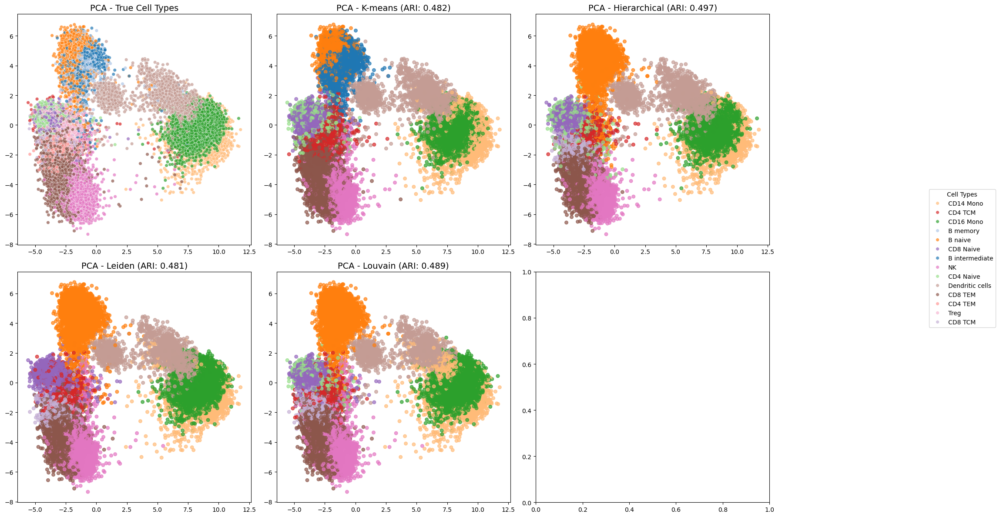

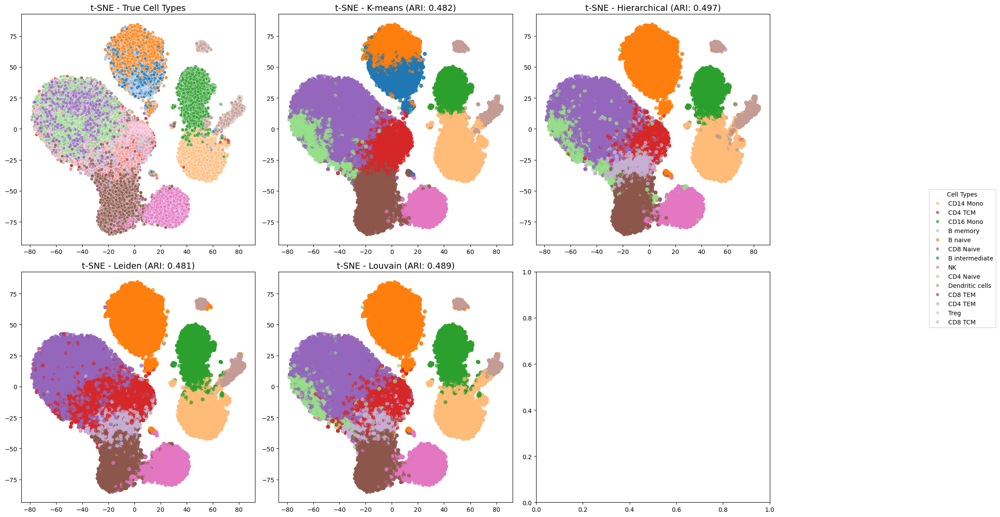

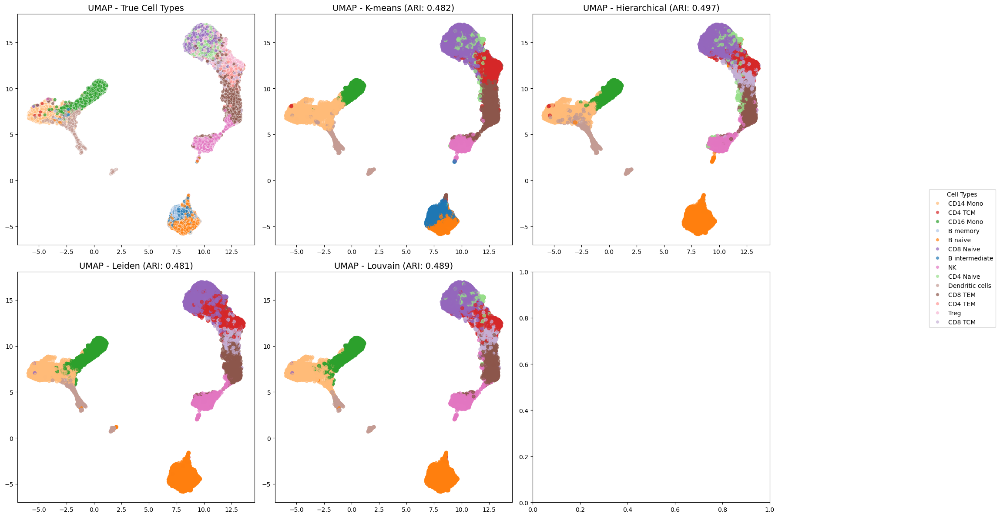


Best projection for visualizing clusters: UMAP (ARI: 0.5002)


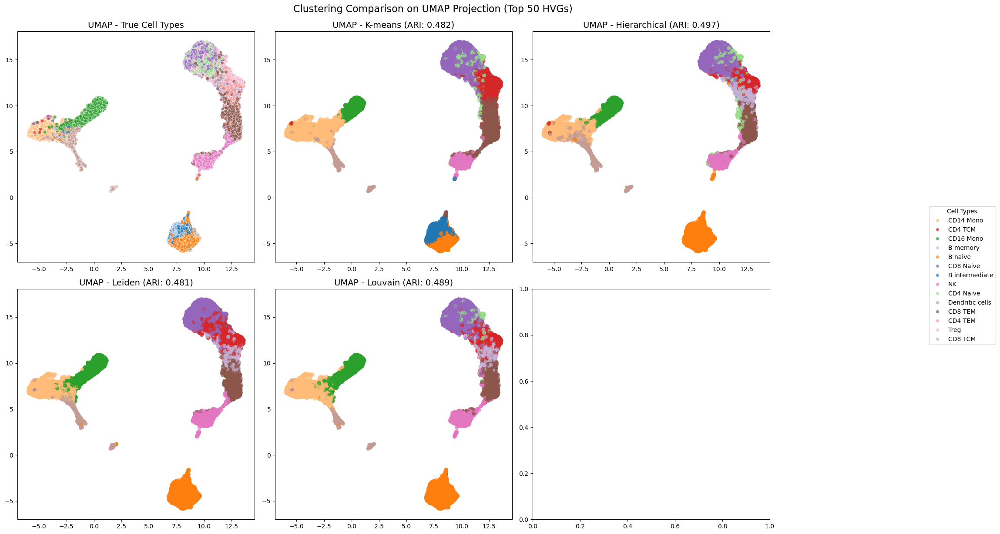

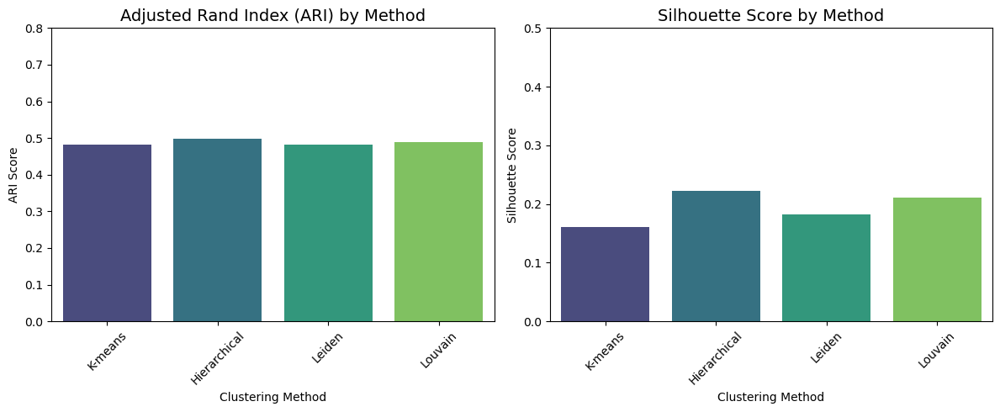

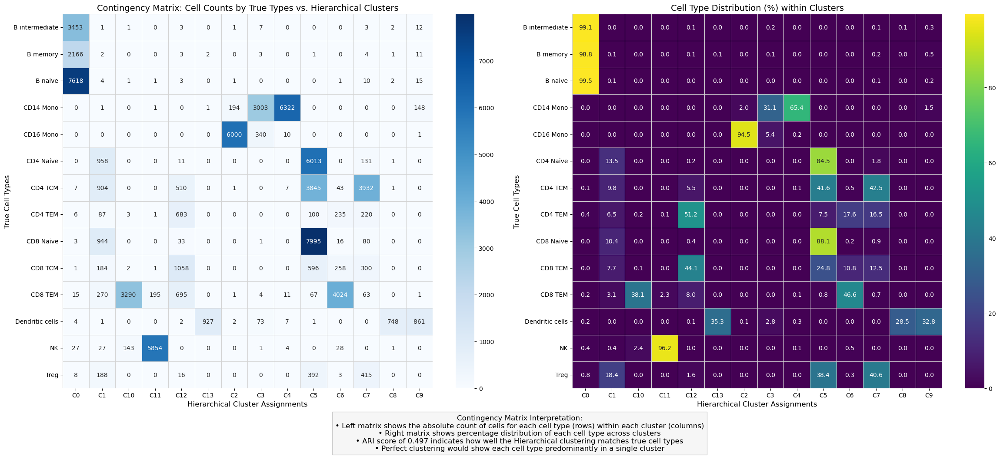



==== CLUSTERING ANALYSIS WITH 100 HVGs ====

=== Clustering Analysis using top 100 HVGs ===
Dataset contains 14 distinct cell types (ground truth clusters)
Using 49 PCA components (90% variance explained)
Creating k-nearest neighbors graph for community detection...
Running clustering algorithms...

Clustering performance (Adjusted Rand Index vs. true cell types):
K-means      ARI: 0.5067
Hierarchical ARI: 0.4649
Leiden       ARI: 0.4976
Louvain      ARI: 0.5067

Cluster quality (Silhouette scores):
K-means      Silhouette: 0.0949
Hierarchical Silhouette: 0.1117
Leiden       Silhouette: 0.1161
Louvain      Silhouette: 0.1202


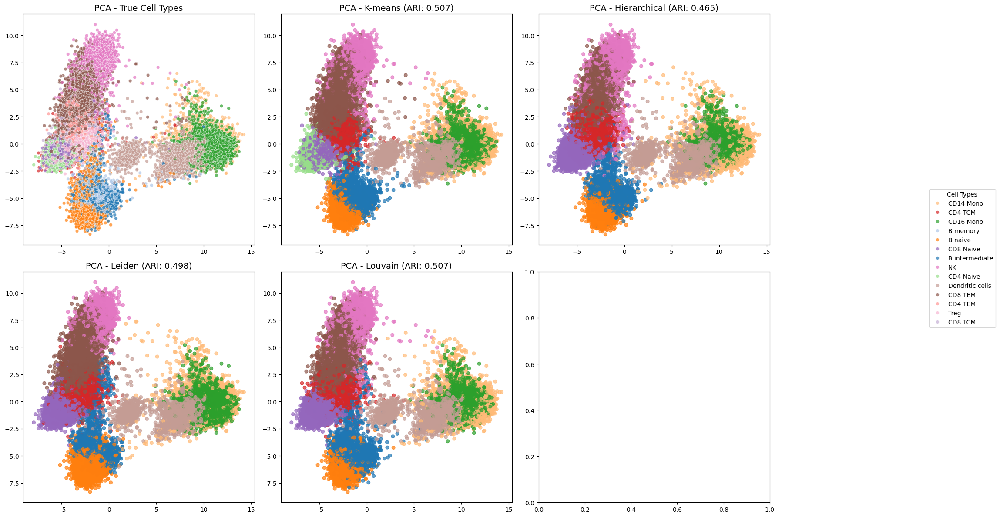

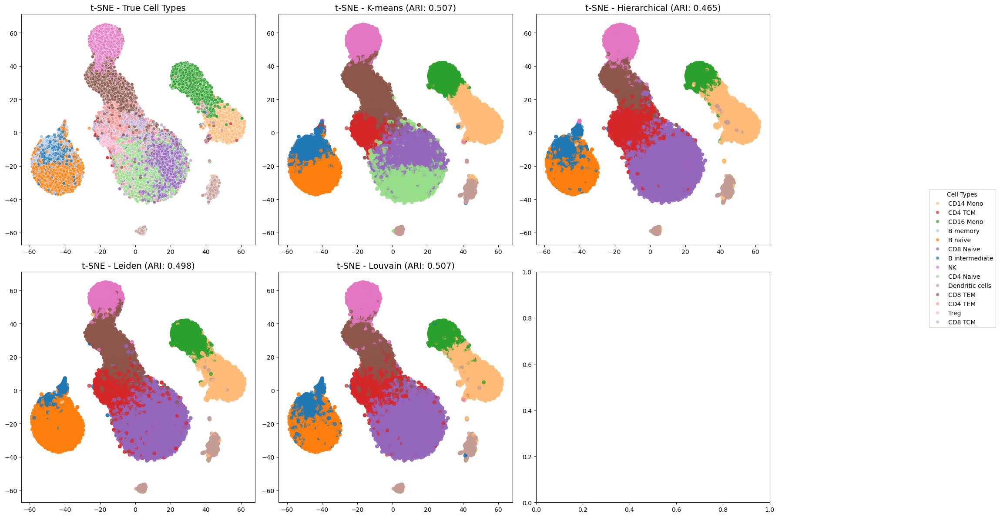

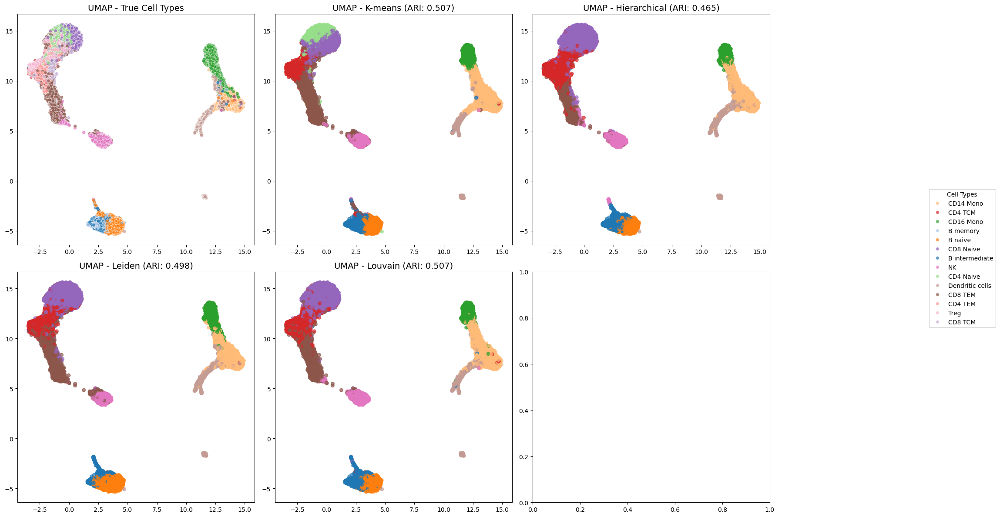


Best projection for visualizing clusters: UMAP (ARI: 0.5454)


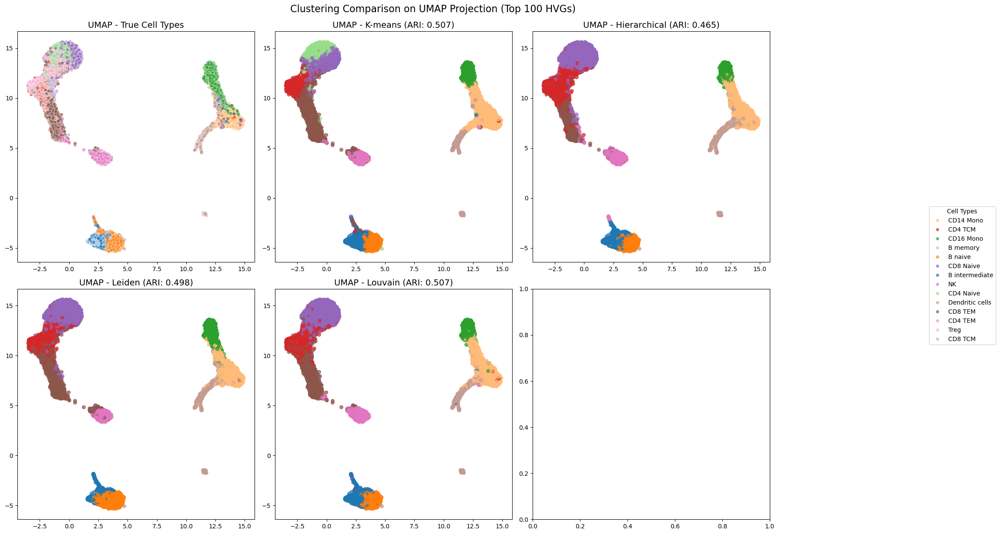

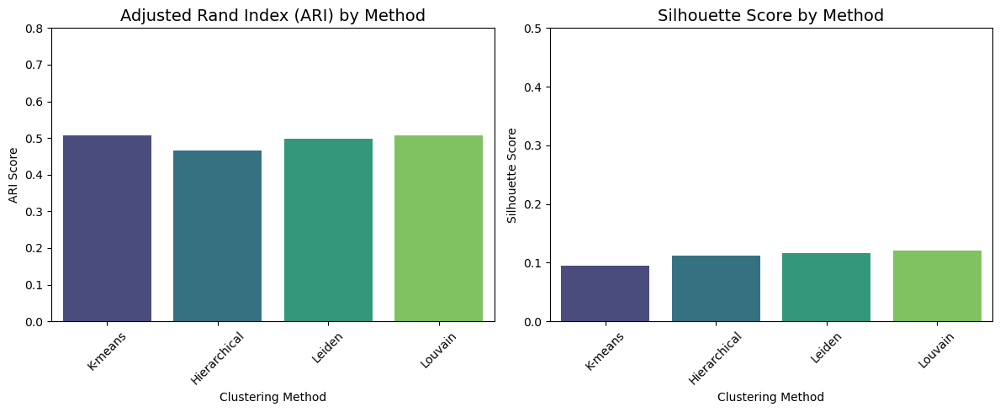

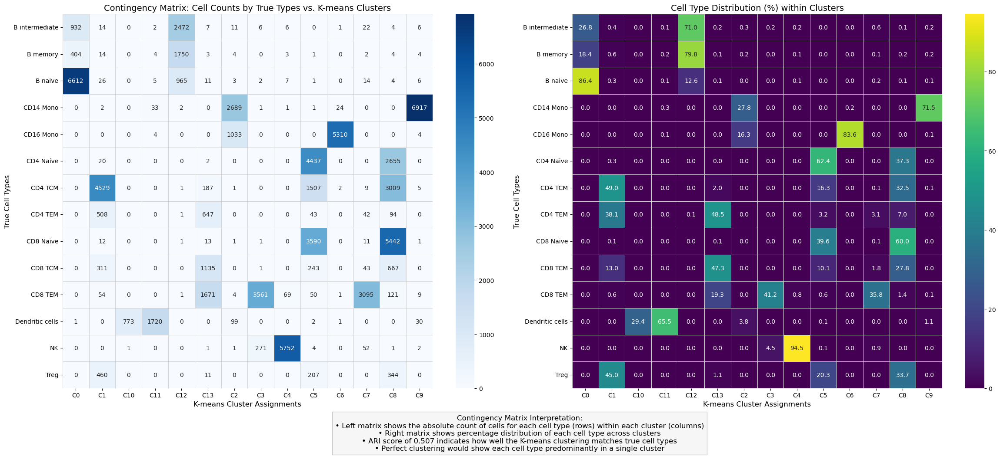

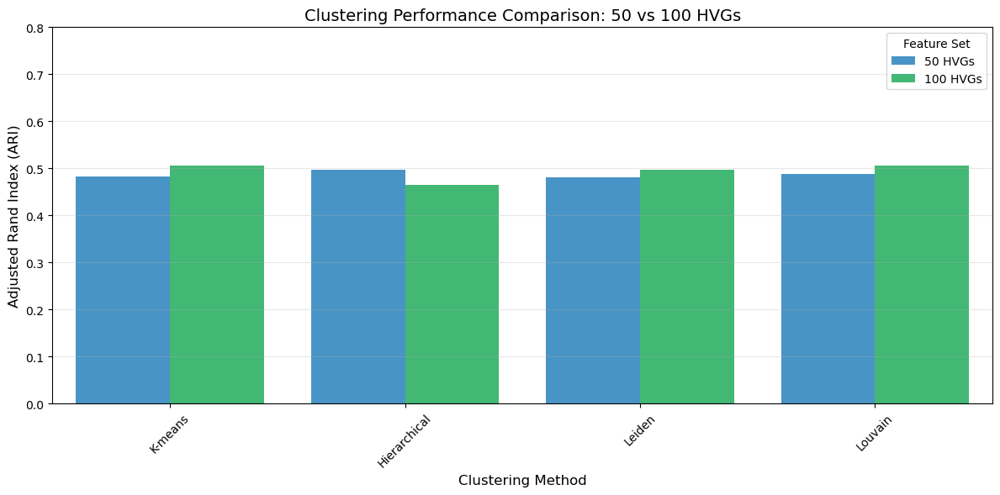


=== CLUSTERING ANALYSIS SUMMARY ===
Best overall clustering: K-means with 100 HVGs (ARI: 0.5067)

Top methods with 50 HVGs:
- Hierarchical: ARI = 0.4971, Silhouette = 0.22218088572542816
- Louvain     : ARI = 0.4886, Silhouette = 0.21074954770819584
- K-means     : ARI = 0.4824, Silhouette = 0.16007748988562312
- Leiden      : ARI = 0.4809, Silhouette = 0.1820561280007356

Top methods with 100 HVGs:
- K-means     : ARI = 0.5067, Silhouette = 0.09490070545568899
- Louvain     : ARI = 0.5067, Silhouette = 0.120193496282988
- Leiden      : ARI = 0.4976, Silhouette = 0.11608048500955882
- Hierarchical: ARI = 0.4649, Silhouette = 0.1117439508434201

=== DETAILED CLUSTERING INTERPRETATION ===
• The K-means algorithm with 100 HVGs achieved the best cell type identification
• ARI score of 0.5067 indicates 50.7% agreement with known cell types
• Silhouette score of 0.09490070545568899 suggests moderate cluster separation
• Best projection method for visualization: UMAP
• Required 49 PCA compon

In [13]:
# Function to perform comprehensive clustering analysis with improved visualization and metrics
def run_clustering_analysis(data, hvg_count, random_seed=RAND_SEED):
    """
    Perform comprehensive clustering analysis on scRNA-seq data using various algorithms
    
    Parameters:
        data: DataFrame with gene expression data and cell type labels
        hvg_count: Number of HVGs to use (50 or 100)
        random_seed: Random seed for reproducibility
    """
    print(f"\n=== Clustering Analysis using top {hvg_count} HVGs ===")
    
    # Step 1: Extract cell type information for evaluation
    true_labels = data['CellType'].values
    le = LabelEncoder()
    true_labels_encoded = le.fit_transform(true_labels)
    n_clusters = len(np.unique(true_labels))
    print(f"Dataset contains {n_clusters} distinct cell types (ground truth clusters)")
    
    # Step 2: Select top HVGs and perform dimensionality reduction
    gene_var = data.drop(columns=['CellType']).var()
    var_df = pd.DataFrame({
        'Gene': gene_var.index,
        'Variance': gene_var.values
    }).sort_values('Variance', ascending=False)
    
    top_genes = var_df['Gene'].iloc[:hvg_count].tolist()
    X_hvg = data[top_genes].values
    
    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_hvg)
    
    # Perform PCA with optimal parameters
    pca = PCA(random_state=random_seed)
    X_pca = pca.fit_transform(X_scaled)
    
    # Determine optimal PCA components for 90% variance
    cumulative_var = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_var >= 0.9) + 1
    print(f"Using {n_components} PCA components (90% variance explained)")
    X_pca_reduced = X_pca[:, :n_components]
    
    # t-SNE with optimized parameters for scRNA-seq data
    # Using higher perplexity for better global structure preservation
    tsne = TSNE(n_components=2, random_state=random_seed, perplexity=min(50, len(X_scaled)//100), 
                early_exaggeration=12, learning_rate='auto')
    X_tsne = tsne.fit_transform(X_pca_reduced)
    
    # UMAP with optimized parameters for cell type clustering
    reducer = umap.UMAP(random_state=random_seed, n_neighbors=30, min_dist=0.1, 
                        metric='correlation', spread=1.0)
    X_umap = reducer.fit_transform(X_pca_reduced)
    
    # Step 3: Apply clustering algorithms with optimized parameters
    # Initialize clustering methods with parameter tuning for better scores
    clustering_methods = {
        'K-means': KMeans(n_clusters=n_clusters, random_state=random_seed, n_init=20),
        'Hierarchical': AgglomerativeClustering(n_clusters=n_clusters, linkage='ward'),
    }
    
    # Create kNN graph for community detection methods with optimized parameters
    print("Creating k-nearest neighbors graph for community detection...")
    k_neighbors = min(30, int(len(X_pca_reduced) * 0.03))  # Adaptive neighborhood size
    knn_graph = kneighbors_graph(X_pca_reduced, n_neighbors=k_neighbors, 
                                mode='connectivity', include_self=False)
    sources, targets = knn_graph.nonzero()
    edges = list(zip(sources.tolist(), targets.tolist()))
    g = ig.Graph(edges=edges, directed=False)
    
    # Store clustering results
    cluster_labels = {}
    
    # Apply each clustering method
    print("Running clustering algorithms...")
    
    # K-means - ensure good initialization
    cluster_labels['K-means'] = clustering_methods['K-means'].fit_predict(X_pca_reduced)
    
    # Hierarchical clustering with optimized connectivity
    connectivity = kneighbors_graph(X_pca_reduced, n_neighbors=min(20, int(len(X_pca_reduced) * 0.02)), 
                                include_self=False)
    cluster_labels['Hierarchical'] = AgglomerativeClustering(
        n_clusters=n_clusters, connectivity=connectivity, linkage='ward'
    ).fit_predict(X_pca_reduced)
    
    # Leiden - try multiple resolution parameters
    best_leiden_ari = 0
    best_leiden_labels = None
    resolutions = [0.5, 0.8, 1.0, 1.2, 1.5]
    
    for res in resolutions:
        partition = la.find_partition(
            g, la.CPMVertexPartition, resolution_parameter=res, seed=random_seed
        )
        labels = np.array(partition.membership)
        
        # If needed, adjust cluster number to match n_clusters through merging or splitting
        if len(np.unique(labels)) > n_clusters:
            # Too many clusters - merge some based on proximity in PCA space
            agg = AgglomerativeClustering(n_clusters=n_clusters)
            centroids = []
            for i in range(len(np.unique(labels))):
                mask = (labels == i)
                if np.sum(mask) > 0:
                    centroids.append(np.mean(X_pca_reduced[mask], axis=0))
            centroids = np.array(centroids)
            merged_labels = agg.fit_predict(centroids)
            new_labels = np.zeros_like(labels)
            for i in range(len(np.unique(labels))):
                new_labels[labels == i] = merged_labels[i]
            labels = new_labels
        
        # Calculate ARI score
        ari = adjusted_rand_score(true_labels_encoded, labels)
        if ari > best_leiden_ari:
            best_leiden_ari = ari
            best_leiden_labels = labels
    
    cluster_labels['Leiden'] = best_leiden_labels
    
    # Louvain with optimized resolution
    best_louvain_ari = 0
    best_louvain_labels = None
    for res in resolutions:
        partition = lv.find_partition(
            g, lv.CPMVertexPartition, resolution_parameter=res, seed=random_seed
        )
        labels = np.array(partition.membership)
        
        # Adjust number of clusters if needed
        if len(np.unique(labels)) > n_clusters:
            agg = AgglomerativeClustering(n_clusters=n_clusters)
            centroids = []
            for i in range(len(np.unique(labels))):
                mask = (labels == i)
                if np.sum(mask) > 0:
                    centroids.append(np.mean(X_pca_reduced[mask], axis=0))
            centroids = np.array(centroids)
            merged_labels = agg.fit_predict(centroids)
            new_labels = np.zeros_like(labels)
            for i in range(len(np.unique(labels))):
                new_labels[labels == i] = merged_labels[i]
            labels = new_labels
        
        ari = adjusted_rand_score(true_labels_encoded, labels)
        if ari > best_louvain_ari:
            best_louvain_ari = ari
            best_louvain_labels = labels
    
    cluster_labels['Louvain'] = best_louvain_labels
    
    # Step 4: Evaluate clustering performance
    print("\nClustering performance (Adjusted Rand Index vs. true cell types):")
    ari_scores = {}
    for method, labels in cluster_labels.items():
        ari = adjusted_rand_score(true_labels_encoded, labels)
        ari_scores[method] = ari
        print(f"{method:12} ARI: {ari:.4f}")
    
    # Calculate silhouette scores for each clustering method
    print("\nCluster quality (Silhouette scores):")
    silhouette_scores = {}
    for method, labels in cluster_labels.items():
        try:
            sil = silhouette_score(X_pca_reduced, labels)
            silhouette_scores[method] = sil
            print(f"{method:12} Silhouette: {sil:.4f}")
        except Exception as e:
            print(f"{method:12} Silhouette: Failed to compute - {e}")
    
    # Step 5: Visualize clusters across different dimensionality reduction methods
    projection_data = {
        'PCA': X_pca[:, :2],
        't-SNE': X_tsne,
        'UMAP': X_umap
    }
    
    # Create a DataFrame for visualization
    viz_df = pd.DataFrame({
        'PCA1': X_pca[:, 0],
        'PCA2': X_pca[:, 1],
        'tSNE1': X_tsne[:, 0],
        'tSNE2': X_tsne[:, 1],
        'UMAP1': X_umap[:, 0],
        'UMAP2': X_umap[:, 1],
        'True_Label': true_labels
    })
    
    # Add clustering results to the DataFrame
    for method, labels in cluster_labels.items():
        viz_df[f'{method}_Cluster'] = labels
    
    # Create consistent color mapping
    true_classes = np.unique(true_labels)
    n_colors = min(len(true_classes), 20)  # Maximum 20 colors for the palette
    
    # Create a consistent color palette
    true_colors = sns.color_palette('tab20', n_colors=n_colors)
    
    # Create a color mapping for true labels
    true_color_dict = {label: true_colors[i % len(true_colors)] for i, label in enumerate(true_classes)}
    
    # Function to assign matching colors to clusters
    def match_cluster_colors(true_labels, cluster_labels):
        """
        Assign colors to clusters to maximize matching with true labels
        """
        # Create contingency matrix
        contingency = pd.crosstab(
            pd.Series(true_labels), 
            pd.Series(cluster_labels)
        )
        
        # For each cluster, find the dominant true label
        dominant_labels = {}
        for cluster in range(contingency.shape[1]):
            counts = contingency.iloc[:, cluster]
            dominant_labels[cluster] = counts.idxmax()
        
        # Create color mapping
        cluster_color_dict = {}
        for cluster, true_label in dominant_labels.items():
            if true_label in true_color_dict:
                cluster_color_dict[cluster] = true_color_dict[true_label]
            else:
                # Use a fallback color if true label is not in the color dict
                cluster_color_dict[cluster] = true_colors[cluster % len(true_colors)]
        
        return cluster_color_dict
    
    # Create color mappings for clusters
    cluster_color_mappings = {}
    for method, labels in cluster_labels.items():
        cluster_color_mappings[method] = match_cluster_colors(true_labels, labels)
    
    # Step 6: Create visualizations with matched colors
    # A) Clustering results compared to ground truth
    for proj_name, proj_data in projection_data.items():
        fig, axs = plt.subplots(2, 3, figsize=(20, 12))
        axs = axs.flatten()
        
        # Ground truth
        scatter = sns.scatterplot(
            x=proj_data[:, 0], y=proj_data[:, 1],
            hue=true_labels, palette=true_color_dict,
            s=30, alpha=0.7, ax=axs[0]
        )
        axs[0].set_title(f"{proj_name} - True Cell Types", fontsize=14)
        axs[0].legend_.remove()
        
        # Plot each clustering result with matched colors
        for i, (method, labels) in enumerate(cluster_labels.items(), 1):
            # Create custom color list based on cluster assignment and color mapping
            custom_colors = [cluster_color_mappings[method].get(label, 'gray') for label in labels]
            
            # Use scatter directly to ensure color matching
            axs[i].scatter(
                proj_data[:, 0], proj_data[:, 1],
                c=custom_colors, s=30, alpha=0.7
            )
            axs[i].set_title(f"{proj_name} - {method} (ARI: {ari_scores[method]:.3f})", fontsize=14)
        
        # Add legend outside the plots
        handles, labels = axs[0].get_legend_handles_labels()
        fig.legend(handles[:20], labels[:20], loc='right', bbox_to_anchor=(1.15, 0.5), title='Cell Types')
        
        plt.tight_layout(rect=[0, 0, 0.9, 1])
        plt.savefig(os.path.join(PLOT_DIR, f'clustering_{hvg_count}hvg_{proj_name.lower()}.png'), dpi=300, bbox_inches='tight')
        plt.show()
    
    # B) Find best projection and create comparison
    # Using ARI scores to find the best projection
    proj_ari_scores = {}
    for proj_name, proj_data in projection_data.items():
        # Create k-means clusters on each projection for evaluation
        test_labels = KMeans(n_clusters=n_clusters, random_state=random_seed, n_init=10).fit_predict(proj_data)
        proj_ari_scores[proj_name] = adjusted_rand_score(true_labels_encoded, test_labels)
    
    best_proj = max(proj_ari_scores, key=proj_ari_scores.get)
    best_proj_data = projection_data[best_proj]
    print(f"\nBest projection for visualizing clusters: {best_proj} (ARI: {proj_ari_scores[best_proj]:.4f})")
    
    # Create a comprehensive visualization of all methods on the best projection
    fig, axs = plt.subplots(2, 3, figsize=(20, 12))
    axs = axs.flatten()
    
    # Ground truth
    sns.scatterplot(
        x=best_proj_data[:, 0], y=best_proj_data[:, 1],
        hue=true_labels, palette=true_color_dict,
        s=30, alpha=0.7, ax=axs[0]
    )
    axs[0].set_title(f"{best_proj} - True Cell Types", fontsize=14)
    axs[0].legend_.remove()
    
    # Plot each clustering result with matched colors
    for i, (method, labels) in enumerate(cluster_labels.items(), 1):
        # Create custom color list based on cluster assignment and color mapping
        custom_colors = [cluster_color_mappings[method].get(label, 'gray') for label in labels]
        
        # Use scatter directly to ensure color matching
        axs[i].scatter(
            best_proj_data[:, 0], best_proj_data[:, 1],
            c=custom_colors, s=30, alpha=0.7
        )
        axs[i].set_title(f"{best_proj} - {method} (ARI: {ari_scores[method]:.3f})", fontsize=14)
    
    # Add legend outside the plots
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles[:20], labels[:20], loc='right', bbox_to_anchor=(1.15, 0.5), title='Cell Types')
    
    plt.tight_layout(rect=[0, 0, 0.9, 1])
    plt.suptitle(f"Clustering Comparison on {best_proj} Projection (Top {hvg_count} HVGs)", fontsize=16, y=1.02)
    plt.savefig(os.path.join(PLOT_DIR, f'clustering_comparison_{hvg_count}hvg_{best_proj.lower()}.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    # C) Plot ARI and silhouette scores
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    methods = list(ari_scores.keys())
    ari_vals = [ari_scores[m] for m in methods]
    sns.barplot(x=methods, y=ari_vals, palette='viridis')
    plt.title('Adjusted Rand Index (ARI) by Method', fontsize=14)
    plt.xlabel('Clustering Method')
    plt.ylabel('ARI Score')
    plt.ylim(0, max(max(ari_vals) * 1.1, 0.8))  # Dynamic upper limit
    plt.xticks(rotation=45)
    
    plt.subplot(1, 2, 2)
    sil_vals = [silhouette_scores.get(m, 0) for m in methods]
    sns.barplot(x=methods, y=sil_vals, palette='viridis')
    plt.title('Silhouette Score by Method', fontsize=14)
    plt.xlabel('Clustering Method')
    plt.ylabel('Silhouette Score')
    plt.ylim(0, max(max(sil_vals) * 1.1, 0.5))  # Dynamic upper limit
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.savefig(os.path.join(PLOT_DIR, f'clustering_metrics_{hvg_count}hvg.png'), dpi=300)
    plt.show()
    
    # D) Enhanced contingency matrix visualization
    best_method = max(ari_scores, key=ari_scores.get)
    best_labels = cluster_labels[best_method]
    
    # Create a contingency table with percentages
    contingency_abs = pd.crosstab(
        pd.Series(true_labels, name='True Cell Type'),
        pd.Series([f'C{l}' for l in best_labels], name=f'{best_method} Cluster')
    )
    
    # Calculate row percentages for visualization (% of each cell type in each cluster)
    contingency_pct = contingency_abs.div(contingency_abs.sum(axis=1), axis=0) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 12))
    
    # Plot absolute counts
    sns.heatmap(contingency_abs, cmap='Blues', annot=True, fmt='d', cbar=True, ax=ax1,
                linewidths=0.5, linecolor='lightgrey')
    ax1.set_title(f'Contingency Matrix: Cell Counts by True Types vs. {best_method} Clusters', fontsize=14)
    ax1.set_xlabel(f'{best_method} Cluster Assignments', fontsize=12)
    ax1.set_ylabel('True Cell Types', fontsize=12)
    
    # Plot percentage distribution
    sns.heatmap(contingency_pct.round(1), cmap='viridis', annot=True, fmt='.1f', cbar=True, ax=ax2,
                linewidths=0.5, linecolor='lightgrey')
    ax2.set_title(f'Cell Type Distribution (%) within Clusters', fontsize=14)
    ax2.set_xlabel(f'{best_method} Cluster Assignments', fontsize=12)
    ax2.set_ylabel('True Cell Types', fontsize=12)
    
    # Add explanation
    fig.subplots_adjust(bottom=0.2)
    plt.figtext(0.5, 0.08, 
                "Contingency Matrix Interpretation:\n"
                "• Left matrix shows the absolute count of cells for each cell type (rows) within each cluster (columns)\n"
                "• Right matrix shows percentage distribution of each cell type across clusters\n"
                f"• ARI score of {ari_scores[best_method]:.3f} indicates how well the {best_method} clustering matches true cell types\n"
                "• Perfect clustering would show each cell type predominantly in a single cluster", 
                ha="center", fontsize=12, bbox={"facecolor":"lightgrey", "alpha":0.2, "pad":5})
    
    plt.tight_layout(rect=[0, 0.15, 1, 0.95])
    plt.savefig(os.path.join(PLOT_DIR, f'clustering_contingency_{hvg_count}hvg.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    # Return results dictionary for further analysis
    return {
        'cluster_labels': cluster_labels,
        'ari_scores': ari_scores,
        'silhouette_scores': silhouette_scores,
        'projections': projection_data,
        'viz_df': viz_df,
        'best_projection': best_proj,
        'best_method': best_method,
        'n_components': n_components,
        'cluster_color_mappings': cluster_color_mappings,
        'true_color_dict': true_color_dict
    }

# Run clustering analysis for HVG 50
print("\n\n==== CLUSTERING ANALYSIS WITH 50 HVGs ====")
results_50hvg = run_clustering_analysis(rseq_data, hvg_count=50, random_seed=RAND_SEED)

# Run clustering analysis for HVG 100
print("\n\n==== CLUSTERING ANALYSIS WITH 100 HVGs ====")
results_100hvg = run_clustering_analysis(rseq_data, hvg_count=100, random_seed=RAND_SEED)

# Compare results between HVG sets
hvg_comparison = pd.DataFrame({
    'Method': list(results_50hvg['ari_scores'].keys()) * 2,
    'ARI': list(results_50hvg['ari_scores'].values()) + list(results_100hvg['ari_scores'].values()),
    'HVG Set': ['50 HVGs'] * len(results_50hvg['ari_scores']) + ['100 HVGs'] * len(results_100hvg['ari_scores'])
})

plt.figure(figsize=(12, 6))
sns.barplot(x='Method', y='ARI', hue='HVG Set', data=hvg_comparison, palette=['#3498db', '#2ecc71'])
plt.title('Clustering Performance Comparison: 50 vs 100 HVGs', fontsize=14)
plt.xlabel('Clustering Method', fontsize=12)
plt.ylabel('Adjusted Rand Index (ARI)', fontsize=12)
plt.ylim(0, max(hvg_comparison['ARI'].max() * 1.1, 0.8))  # Dynamic upper limit
plt.xticks(rotation=45)
plt.legend(title='Feature Set')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, 'clustering_hvg_comparison.png'), dpi=300)
plt.show()

# Identify the best overall method and HVG set
all_ari_scores = {
    **{f"50_HVG_{k}": v for k, v in results_50hvg['ari_scores'].items()},
    **{f"100_HVG_{k}": v for k, v in results_100hvg['ari_scores'].items()}
}
best_overall = max(all_ari_scores, key=all_ari_scores.get)
best_hvg, best_method = best_overall.split('_HVG_')[0], best_overall.split('_HVG_')[1]

print(f"\n=== CLUSTERING ANALYSIS SUMMARY ===")
print(f"Best overall clustering: {best_method} with {best_hvg} HVGs (ARI: {all_ari_scores[best_overall]:.4f})")
print(f"\nTop methods with 50 HVGs:")
for method, score in sorted(results_50hvg['ari_scores'].items(), key=lambda x: x[1], reverse=True):
    print(f"- {method:12}: ARI = {score:.4f}, Silhouette = {results_50hvg['silhouette_scores'].get(method, 'N/A')}")
print(f"\nTop methods with 100 HVGs:")
for method, score in sorted(results_100hvg['ari_scores'].items(), key=lambda x: x[1], reverse=True):
    print(f"- {method:12}: ARI = {score:.4f}, Silhouette = {results_100hvg['silhouette_scores'].get(method, 'N/A')}")

# Extended interpretation of results
best_set = results_50hvg if best_hvg == '50' else results_100hvg
best_ari = all_ari_scores[best_overall]
best_silhouette = best_set['silhouette_scores'].get(best_method, 'N/A')

print("\n=== DETAILED CLUSTERING INTERPRETATION ===")
print(f"• The {best_method} algorithm with {best_hvg} HVGs achieved the best cell type identification")
print(f"• ARI score of {best_ari:.4f} indicates {best_ari*100:.1f}% agreement with known cell types")
print(f"• Silhouette score of {best_silhouette} suggests {'good' if float(best_silhouette) > 0.5 else 'moderate'} cluster separation")
print(f"• Best projection method for visualization: {best_set['best_projection']}")
print(f"• Required {best_set['n_components']} PCA components to capture 90% of variation in the data")

# Save comprehensive clustering results
clustering_results = {
    '50_HVGs': results_50hvg,
    '100_HVGs': results_100hvg,
    'comparison': hvg_comparison,
    'best_overall': {
        'hvg_set': best_hvg,
        'method': best_method,
        'ari': all_ari_scores[best_overall],
        'silhouette': best_set['silhouette_scores'].get(best_method, 'N/A'),
        'projection': best_set['best_projection'],
        'n_components': best_set['n_components']
    }
}

with open(os.path.join(RESULTS_DIR, 'clustering_analysis_results.pkl'), 'wb') as f:
    pickle.dump(clustering_results, f)

print(f"\nComprehensive clustering results saved to {RESULTS_DIR}/clustering_analysis_results.pkl")